In [1]:
#import lightgbm
import random
import pandas as pd
import numpy as np
import os
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, PredefinedSplit, KFold, TimeSeriesSplit
from sklearn.metrics import make_scorer
import matplotlib.pyplot as plt
from tqdm import tqdm
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series

import warnings
warnings.filterwarnings(action='ignore')

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(42) # Seed 고정

In [2]:
#데이터 불러오기
train_df = pd.read_csv('./data/train.csv')
test_df = pd.read_csv('./data/test.csv')
building_info =  pd.read_csv('./data/building_info.csv')

train_df = train_df.rename(columns={
    '건물번호': 'building_number',
    '일시': 'date_time',
    '기온(C)': 'temperature',
    '강수량(mm)': 'rainfall',
    '풍속(m/s)': 'windspeed',
    '습도(%)': 'humidity',
    '일조(hr)': 'sunshine',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power_consumption'
})
test_df = test_df.rename(columns={
    '건물번호': 'building_number',
    '일시': 'date_time',
    '기온(C)': 'temperature',
    '강수량(mm)': 'rainfall',
    '풍속(m/s)': 'windspeed',
    '습도(%)': 'humidity',
    '일조(hr)': 'sunshine',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power_consumption'
})
building_info = building_info.rename(columns={
    '건물번호': 'building_number',
    '건물유형': 'building_type',
    '연면적(m2)': 'total_area',
    '냉방면적(m2)': 'cooling_area',
    '태양광용량(kW)': 'solar_power_capacity',
    'ESS저장용량(kWh)': 'ess_capacity',
    'PCS용량(kW)': 'pcs_capacity'
})
translation_dict = {
    '건물기타': 'Other Buildings',
    '공공': 'Public',
    '대학교': 'University',
    '데이터센터': 'Data Center',
    '백화점및아울렛': 'Department Store and Outlet',
    '병원': 'Hospital',
    '상용': 'Commercial',
    '아파트': 'Apartment',
    '연구소': 'Research Institute',
    '지식산업센터': 'Knowledge Industry Center',
    '할인마트': 'Discount Mart',
    '호텔및리조트': 'Hotel and Resort'
}

building_info['building_type'] = building_info['building_type'].replace(translation_dict)


train_df.head()

,num_date_time,building_number,date_time,temperature,rainfall,windspeed,humidity,sunshine,solar_radiation,power_consumption
0,1_20220601 00,1,20220601 00,18.6,NaN,0.9,42.0,NaN,NaN,1085.28
1,1_20220601 01,1,20220601 01,18.0,NaN,1.1,45.0,NaN,NaN,1047.36
2,1_20220601 02,1,20220601 02,17.7,NaN,1.5,45.0,NaN,NaN,974.88
3,1_20220601 03,1,20220601 03,16.7,NaN,1.4,48.0,NaN,NaN,953.76
4,1_20220601 04,1,20220601 04,18.4,NaN,2.8,43.0,NaN,NaN,986.40


In [3]:
test_df.head()

,num_date_time,building_number,date_time,temperature,rainfall,windspeed,humidity
0,1_20220825 00,1,20220825 00,23.5,0.0,2.2,72
1,1_20220825 01,1,20220825 01,23.0,0.0,0.9,72
2,1_20220825 02,1,20220825 02,22.7,0.0,1.5,75
3,1_20220825 03,1,20220825 03,22.1,0.0,1.3,78
4,1_20220825 04,1,20220825 04,21.8,0.0,1.0,77


In [4]:
building_info.head()

,building_number,building_type,total_area,cooling_area,solar_power_capacity,ess_capacity,pcs_capacity
0,1,Other Buildings,110634.00,39570.00,-,-,-
1,2,Other Buildings,122233.47,99000.00,-,-,-
2,3,Other Buildings,171243.00,113950.00,40,-,-
3,4,Other Buildings,74312.98,34419.62,60,-,-
4,5,Other Buildings,205884.00,150000.00,-,2557,1000


Train 과 Test의 차이: columns에 일조, 일사, 전력 소비량이 없다.

## 전처리 (병합, 빈칸 채우기, 형 변환, num_date_time 삭제)

In [3]:

pd.set_option('display.max_columns', 30)

def merge(df):
    df = df.fillna(0)
    date = pd.to_datetime(df.date_time)
    df['hour'] = date.dt.hour
    df['day'] = date.dt.weekday
    df['month'] = date.dt.month
    df['week'] = date.dt.weekofyear
    
    # 'building_number'를 기준으로 두 데이터프레임 병합 및 전처리
    merged_df = pd.merge(df, building_info, on='building_number',how='right')
    #merge후 전처리
    merged_df['solar_power_capacity'] = merged_df['solar_power_capacity'].replace('-', 0)
    merged_df['ess_capacity'] = merged_df['ess_capacity'].replace('-', 0)
    merged_df['pcs_capacity'] = merged_df['pcs_capacity'].replace('-', 0)

    merged_df['solar_power_capacity'] = merged_df['solar_power_capacity'].astype('float64')
    merged_df['ess_capacity'] = merged_df['ess_capacity'].astype('float64')
    merged_df['pcs_capacity'] = merged_df['pcs_capacity'].astype('float64')
    return merged_df.drop(columns =['num_date_time','building_type'])


merged_train_df_m = merge(train_df)
merged_test_df_m = merge(test_df)

kk = merged_train_df_m.loc[(merged_train_df_m.building_number == 95)&(merged_train_df_m.hour == 16)&(merged_train_df_m.day == 2), 'power_consumption']
sum16 = kk.sum()/12
kkk = merged_train_df_m.loc[(merged_train_df_m.building_number == 95)&(merged_train_df_m.hour == 17)&(merged_train_df_m.day == 2), 'power_consumption']
sum17 = (kkk.sum()-0.36)/12
merged_train_df_m.loc[(merged_train_df_m.building_number == 95)&(merged_train_df_m.hour == 16)&(merged_train_df_m.day == 2)&(merged_train_df_m.month == 7)&(merged_train_df_m.week == 30)
                    , 'power_consumption'] = sum16
merged_train_df_m.loc[(merged_train_df_m.building_number == 95)&(merged_train_df_m.hour == 17)&(merged_train_df_m.day == 2)&(merged_train_df_m.month == 7)&(merged_train_df_m.week == 30)
                    , 'power_consumption'] = sum17

# #######################################
# ## 건물별, 요일별, 시간별 발전량 평균 넣어주기
# #######################################
# power_mean = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour', 'day'], aggfunc = np.mean).reset_index()
# tqdm.pandas()
# #######################################
# ## 건물별 시간별 발전량 평균 넣어주기
# #######################################
# power_hour_mean = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.mean).reset_index()
# tqdm.pandas()
#     #######################################
# ## 건물별 시간별 발전량 표준편차 넣어주기
# #######################################
# power_hour_std = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.std).reset_index()
# tqdm.pandas()

In [4]:
def preprocessing(df):
    # df['day_hour_mean'] = df.progress_apply(lambda x : power_mean.loc[(power_mean.building_number == x['building_number']) & (power_mean.hour == x['hour']) & (power_mean.day == x['day']) ,'power_consumption'].values[0], axis = 1)
    # df['hour_mean'] = df.progress_apply(lambda x : power_hour_mean.loc[(power_hour_mean.building_number == x['building_number']) & (power_hour_mean.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)   
    # df['hour_std'] = df.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.building_number == x['building_number']) & (power_hour_std.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)
    
    #######################################
    ## 건물별, 요일별, 전력시간별 소비량 평균 넣어주기
    #######################################
    power_mean = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour', 'day'], aggfunc = np.mean).reset_index()
    #######################################
    ## 건물별, 요일별, 전력시간별 소비량 표준편차 넣어주기
    #######################################
    power_std = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour', 'day'], aggfunc = np.std).reset_index()
    #######################################
    ## 건물별 시간별 전력소비량 평균 넣어주기
    #######################################
    power_hour_mean = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.mean).reset_index()
    #######################################
    ## 건물별 시간별 전력소비량 표준편차 넣어주기
    #######################################
    power_hour_std = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.std).reset_index()
    
    
    # 병합을 위한 키 설정
    merge_keys = ['building_number', 'hour', 'day']  
    # 데이터프레임 병합
    df = df.merge(power_mean[merge_keys + ['power_consumption']], on=merge_keys, how='left', suffixes=('', '_day_hour_mean'))
    df = df.merge(power_std[merge_keys + ['power_consumption']], on=merge_keys, how='left', suffixes=('', '_day_hour_std'))
    df = df.merge(power_hour_mean[merge_keys[:-1] + ['power_consumption']], on=merge_keys[:-1], how='left', suffixes=('', '_hour_mean'))
    df = df.merge(power_hour_std[merge_keys[:-1] + ['power_consumption']], on=merge_keys[:-1], how='left', suffixes=('', '_hour_std'))
    df = df.rename(columns = {'power_consumption_day_hour_mean':'day_hour_mean','power_consumption_day_hour_std':'day_hour_std','power_consumption_hour_mean':'hour_mean','power_consumption_hour_std':'hour_std',})
    

    def CDH(xs):
        ys = []
        for i in range(len(xs)):
            if i < 11:
                ys.append(np.sum(xs[:(i+1)]-26))
            else:
                ys.append(np.sum(xs[(i-11):(i+1)]-26))
        return np.array(ys)

    cdhs = np.array([])
    for num in range(1,101,1):
        temp = df[df['building_number'] == num]
        cdh = CDH(temp['temperature'].values)
        cdhs = np.concatenate([cdhs, cdh])
    df['CDH'] = cdhs
    
    ### 공휴일 변수 추가
    df['holiday'] = df.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)
    df['date_time'] = df['date_time'].apply(lambda x : int(x[0:8]))
    # df.loc[(df.date_time == 20220601, 'holiday')] = 1
    # df.loc[(df.date_time == 20220606, 'holiday')] = 1
    # df.loc[(df.date_time == 20220815, 'holiday')] = 1
    df.loc[(df.date_time == 20220601, 'holiday')] = 2
    df.loc[(df.date_time == 20220606, 'holiday')] = 2
    df.loc[(df.date_time == 20220815, 'holiday')] = 2

    ## https://dacon.io/competitions/official/235680/codeshare/2366?page=1&dtype=recent
    df['sin_time'] = np.sin(2*np.pi*df.hour/24)
    df['cos_time'] = np.cos(2*np.pi*df.hour/24)
    
    ## https://dacon.io/competitions/official/235736/codeshare/2743?page=1&dtype=recent
    df['THI'] = 9/5*df['temperature'] - 0.55*(1-df['humidity']/100)*(9/5*df['humidity']-26)+32

    
    return df

merged_train_df_m =preprocessing(merged_train_df_m)
merged_test_df_m =preprocessing(merged_test_df_m).rename(columns = {'power_consumption':'day_hour_mean'})


In [5]:
merged_train_df = pd.DataFrame()
merged_valid_df = pd.DataFrame()
merged_pretest_df = pd.DataFrame()
semi_train_df = pd.DataFrame()
for i in range(1,101,1):
    buff = merged_train_df_m.loc[(merged_train_df_m.building_number == i)]
    semi_train_df = pd.concat([semi_train_df, buff[:-168]])
    merged_train_df = pd.concat([merged_train_df, buff[:-336]])
    merged_pretest_df = pd.concat([merged_pretest_df, buff[-168:]])
    merged_valid_df = pd.concat([merged_valid_df, buff[-336:-168]])

In [6]:

def data_train(df):

    #df['cooling_to_total_area_ratio'] =  df['cooling_area'] / df['total_area']
    
    #grouped = df.groupby(['building_number', 'week', 'day'])
    grouped = df.groupby(['building_number', 'date_time'])

    df['max_power'] = grouped['power_consumption'].transform(np.max)
    df['min_power'] = grouped['power_consumption'].transform(np.min)
    
    #grouped2 = df.groupby(['building_number', 'week', 'day','holiday'])
    grouped2 = df.groupby(['building_number', 'day'])

    df['max_power'] = grouped2['max_power'].transform(np.mean)
    df['min_power'] = grouped2['min_power'].transform(np.mean)

    #df['solar_to_ess_ratio'] = df['solar_power_capacity'] / df['ess_capacity']
    #df['efficiency'] = df['pcs_capacity'] / df['power_consumption']
    
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.fillna(0,inplace=True)
    ## StandardScaler 객체 생성
    #from sklearn.preprocessing import MinMaxScaler
    # scaler = MinMaxScaler()
    ## 데이터 표준화
    # df['solar_to_ess_ratio'] = scaler.fit_transform(df[['solar_to_ess_ratio']])
    # df['efficiency'] = scaler.fit_transform(df[['efficiency']])
    #df.drop(columns=['sunshine','pcs_capacity','ess_capacity','solar_power_capacity','solar_radiation','total_area','cooling_area'],inplace= True)
    df.drop(columns=['cooling_area', 'sunshine','pcs_capacity','ess_capacity','solar_power_capacity','solar_radiation','total_area'],inplace= True)

    return df

def data_test(df):

    #df['cooling_to_total_area_ratio'] =  df['cooling_area'] / df['total_area']
    
    #df.drop(columns=['max_power', 'min_power'])
    grouped_train = merged_train_df.groupby(['building_number', 'day'])
    max_power = grouped_train['max_power'].median()
    min_power = grouped_train['min_power'].median()
    max_power_df = max_power.reset_index()
    min_power_df = min_power.reset_index()

    # 테스트 데이터에 max_power_median와 min_power_median을 추가
    df = pd.merge(df, max_power_df, on=['building_number', 'day'])
    df = pd.merge(df, min_power_df, on=['building_number', 'day'])

    #df['solar_to_ess_ratio'] = df['solar_power_capacity'] / df['ess_capacity']
    #df['efficiency'] = df['pcs_capacity'] / df['power_consumption']
    
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.fillna(0,inplace=True)
    ## StandardScaler 객체 생성
    #from sklearn.preprocessing import MinMaxScaler
    # scaler = MinMaxScaler()
    ## 데이터 표준화
    # df['solar_to_ess_ratio'] = scaler.fit_transform(df[['solar_to_ess_ratio']])
    # df['efficiency'] = scaler.fit_transform(df[['efficiency']])
    #df.drop(columns=['pcs_capacity','ess_capacity','solar_power_capacity','total_area','cooling_area'],inplace= True)
    df.drop(columns=['cooling_area','pcs_capacity','ess_capacity','solar_power_capacity','total_area'],inplace= True)

    return df


merged_train_df =data_train(merged_train_df)
merged_test_df =data_test(merged_test_df_m)

merged_pretest_df =data_test(merged_pretest_df)
merged_valid_df =data_test(merged_valid_df)
merged_semi_train_df =data_train(semi_train_df)

merged_pretest_df = merged_pretest_df.drop(columns = 'sunshine')
merged_pretest_df = merged_pretest_df.drop(columns = 'solar_radiation')
merged_valid_df = merged_valid_df.drop(columns = 'sunshine')
merged_valid_df = merged_valid_df.drop(columns = 'solar_radiation')

In [7]:
final_train_df = data_train(merged_train_df_m)

In [8]:
merged_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 204000 entries, 0 to 203999
Data columns (total 24 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   building_number              204000 non-null  int64  
 1   date_time                    204000 non-null  int64  
 2   temperature                  204000 non-null  float64
 3   rainfall                     204000 non-null  float64
 4   windspeed                    204000 non-null  float64
 5   humidity                     204000 non-null  float64
 6   power_consumption            204000 non-null  float64
 7   hour                         204000 non-null  int64  
 8   day                          204000 non-null  int64  
 9   month                        204000 non-null  int64  
 10  week                         204000 non-null  int64  
 11  cooling_area                 204000 non-null  float64
 12  day_hour_mean                204000 non-null  float64
 13 

In [17]:
## save the preprocessed data
merged_train_df.drop(columns=['date_time']).to_csv('./data/train_preprocessed_split2_lbw.csv')


In [8]:
merged_test_df.drop(columns=['date_time']).to_csv('./data/test_preprocessed_split2_lbw.csv')


In [9]:
final_train_df.drop(columns=['date_time']).to_csv('./data/final_train_preprocessed_split2_lbw.csv')
merged_valid_df.drop(columns=['date_time']).to_csv('./data/valid_preprocessed_split2_lbw.csv')
merged_pretest_df.drop(columns=['date_time']).to_csv('./data/pretest_preprocessed_split2_lbw.csv')
merged_semi_train_df.drop(columns=['date_time']).to_csv('./data/semi_train_preprocessed_split2_lbw.csv')


## 추가 전처리

In [18]:
## save the preprocessed data
merged_train_df = pd.read_csv('./data/train_preprocessed_split2_lbw.csv')
merged_train_df = merged_train_df.drop(columns = 'Unnamed: 0')

In [10]:
merged_test_df = pd.read_csv('./data/test_preprocessed_split2_lbw.csv')
merged_test_df = merged_test_df.drop(columns = 'Unnamed: 0')

In [11]:
final_train_df = pd.read_csv('./data/final_train_preprocessed_split2_lbw.csv')
merged_valid_df = pd.read_csv('./data/valid_preprocessed_split2_lbw.csv')
merged_pretest_df = pd.read_csv('./data/pretest_preprocessed_split2_lbw.csv')
merged_semi_train_df = pd.read_csv('./data/semi_train_preprocessed_split2_lbw.csv')

In [12]:
final_train_df = final_train_df.drop(columns = 'Unnamed: 0')
merged_valid_df = merged_valid_df.drop(columns = 'Unnamed: 0')
merged_pretest_df = merged_pretest_df.drop(columns = 'Unnamed: 0')
merged_semi_train_df = merged_semi_train_df.drop(columns = 'Unnamed: 0')



In [ ]:
#merged_train_df = merged_train_df.drop(columns = 'holiday')
merged_test_df = merged_test_df.drop(columns = 'holiday')
final_train_df = final_train_df.drop(columns = 'holiday')
merged_valid_df = merged_valid_df.drop(columns = 'holiday')
merged_pretest_df = merged_pretest_df.drop(columns = 'holiday')
merged_semi_train_df = merged_semi_train_df.drop(columns = 'holiday')

## 원핫 인코딩(안해도 됨)

In [10]:
# merged_train_df = pd.get_dummies(merged_train_df, prefix=["bt:"], columns=["building_type"])
# merged_train_df.head()
# merged_test_df = pd.get_dummies(merged_test_df, prefix=["bt:"], columns=["building_type"])
# merged_test_df.head()

## 성능 평가지표 정의 및 SMAPE 정의

In [13]:
#### alpha를 argument로 받는 함수로 실제 objective function을 wrapping하여 alpha값을 쉽게 조정할 수 있도록 작성했습니다.
# custom objective function for forcing model not to underestimate
def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

 #점수 측정을 위한 코드
def SMAPE(y_true, y_pred):
    return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

In [ ]:
# for i in np.arange(0.8, 1.0, 0.1):
#     print(i)
# for i in np.arange(1, 101, 1):
#     print(i)   

## 최적의 파라미터 탐색

In [14]:

df = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample'])
preds = np.array([])

grid = {'n_estimators' : [100], 'eta' : [0.01], 'min_child_weight' : np.arange(1, 12, 1),
        'max_depth' : np.arange(3,10,1) , 'colsample_bytree' :np.arange(0.8, 1.0, 0.1),
        'subsample' :np.arange(0.8, 1.0, 0.1)} # fix the n_estimators & eta(learning rate)

#tscv = TimeSeriesSplit(n_splits=3)
smape_score = make_scorer(SMAPE, greater_is_better=False)

for i in tqdm(np.arange(1, 101, 1)):
    y_train = merged_semi_train_df.loc[merged_semi_train_df.building_number == i, 'power_consumption']
    x_train = merged_semi_train_df.loc[merged_semi_train_df.building_number == i].drop(['power_consumption'], axis=1)
    
    y_pretest = merged_pretest_df.loc[merged_pretest_df.building_number == i, 'power_consumption']
    x_pretest = merged_pretest_df.loc[merged_pretest_df.building_number == i].drop(['power_consumption'], axis=1)
    #y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

    pds = PredefinedSplit(np.append(-np.ones(len(x_train)-168), np.zeros(168)))
    gcv = GridSearchCV(estimator = XGBRegressor(seed=0,tree_method="hist"),
                       param_grid=grid, scoring=smape_score, cv=pds, refit=True, verbose=True)
    
    # gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1, tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
    #                     param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)

    gcv.fit(x_train, y_train)
    best = gcv.best_estimator_
    params = gcv.best_params_
    print(params)
    pred = best.predict(x_pretest)
    building = 'building'+str(i)
    print(building + '|| SMAPE : {}'.format(SMAPE(y_pretest, pred)))
    preds = np.append(preds, pred)
    df = pd.concat([df, pd.DataFrame(params, index=[0])], axis=0)
    df.to_csv('./parameters/hyperparameter_xgb_split2_lbw.csv', index=False) # save the tuned parameters


  0%|          | 0/100 [00:00<?, ?it/s]

Fitting 1 folds for each of 308 candidates, totalling 308 fits


  1%|          | 1/100 [00:20<33:13, 20.13s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building1|| SMAPE : 44.83882892707881
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  2%|▏         | 2/100 [00:40<33:07, 20.28s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building2|| SMAPE : 40.84788696744037
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  3%|▎         | 3/100 [01:02<34:21, 21.25s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building3|| SMAPE : 35.824170058812214
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  4%|▍         | 4/100 [01:20<31:46, 19.86s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building4|| SMAPE : 42.45557035164121
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  5%|▌         | 5/100 [01:46<34:47, 21.97s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building5|| SMAPE : 47.07442626225677
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  6%|▌         | 6/100 [02:10<35:28, 22.64s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building6|| SMAPE : 46.892936889509016
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  7%|▋         | 7/100 [02:34<35:50, 23.12s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building7|| SMAPE : 41.30957478711682
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  8%|▊         | 8/100 [02:50<32:00, 20.88s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building8|| SMAPE : 45.13268980691249
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  9%|▉         | 9/100 [03:08<30:26, 20.07s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building9|| SMAPE : 44.917072721334165
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 10%|█         | 10/100 [03:25<28:32, 19.03s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building10|| SMAPE : 37.83170194855983
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 11%|█         | 11/100 [03:40<26:35, 17.93s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building11|| SMAPE : 43.13895913721383
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 12%|█▏        | 12/100 [03:57<25:43, 17.54s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building12|| SMAPE : 45.81103151680163
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 13%|█▎        | 13/100 [04:13<24:44, 17.06s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building13|| SMAPE : 45.61139312079182
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 14%|█▍        | 14/100 [04:32<25:28, 17.78s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building14|| SMAPE : 39.3430418606559
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 15%|█▌        | 15/100 [04:48<24:16, 17.14s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building15|| SMAPE : 42.18573668172601
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 16%|█▌        | 16/100 [05:06<24:21, 17.40s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building16|| SMAPE : 42.032476637691815
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 17%|█▋        | 17/100 [05:25<24:40, 17.84s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building17|| SMAPE : 47.844882636152164
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 18%|█▊        | 18/100 [05:43<24:33, 17.97s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building18|| SMAPE : 48.57772086694697
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 19%|█▉        | 19/100 [06:02<24:30, 18.15s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building19|| SMAPE : 49.746126672879996
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 20%|██        | 20/100 [06:20<24:18, 18.23s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
building20|| SMAPE : 46.946844182049524
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 21%|██        | 21/100 [06:38<23:57, 18.20s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building21|| SMAPE : 45.18746324960525
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 22%|██▏       | 22/100 [06:55<22:51, 17.58s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building22|| SMAPE : 45.519154222354985
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 23%|██▎       | 23/100 [07:10<21:38, 16.87s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building23|| SMAPE : 45.49866449354721
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 24%|██▍       | 24/100 [07:27<21:33, 17.02s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.8}
building24|| SMAPE : 44.71874432458557
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 25%|██▌       | 25/100 [07:44<21:08, 16.91s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building25|| SMAPE : 46.90327634693172
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 26%|██▌       | 26/100 [08:01<21:05, 17.10s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building26|| SMAPE : 44.85900576528123
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 27%|██▋       | 27/100 [08:18<20:30, 16.85s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building27|| SMAPE : 43.26514379679526
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 28%|██▊       | 28/100 [08:35<20:22, 16.98s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building28|| SMAPE : 39.40372153995643
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 29%|██▉       | 29/100 [08:52<19:59, 16.89s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building29|| SMAPE : 42.7822495626615
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 30%|███       | 30/100 [09:11<20:39, 17.71s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building30|| SMAPE : 44.09155824212753
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 31%|███       | 31/100 [09:28<20:13, 17.59s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building31|| SMAPE : 40.527032870207925
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 32%|███▏      | 32/100 [09:40<17:46, 15.69s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building32|| SMAPE : 44.44472880625884
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 33%|███▎      | 33/100 [09:51<16:02, 14.36s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building33|| SMAPE : 45.056957194674006
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 34%|███▍      | 34/100 [10:03<14:54, 13.55s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building34|| SMAPE : 44.58383411174869
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 35%|███▌      | 35/100 [10:14<13:52, 12.81s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building35|| SMAPE : 44.98969193139706
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 36%|███▌      | 36/100 [10:24<12:51, 12.06s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building36|| SMAPE : 44.98054080943704
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 37%|███▋      | 37/100 [10:44<15:08, 14.42s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building37|| SMAPE : 47.23185226776052
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 38%|███▊      | 38/100 [11:05<16:54, 16.37s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building38|| SMAPE : 44.74235521720971
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 39%|███▉      | 39/100 [11:25<17:39, 17.36s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building39|| SMAPE : 47.937262662410696
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 40%|████      | 40/100 [11:47<18:53, 18.89s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building40|| SMAPE : 47.74918310282943
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 41%|████      | 41/100 [12:07<19:00, 19.34s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building41|| SMAPE : 46.3837457785874
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 42%|████▏     | 42/100 [12:29<19:19, 20.00s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building42|| SMAPE : 47.12243986140313
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 43%|████▎     | 43/100 [12:49<19:08, 20.15s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building43|| SMAPE : 44.52995986541657
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 44%|████▍     | 44/100 [13:08<18:16, 19.58s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building44|| SMAPE : 42.85603490689464
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 45%|████▌     | 45/100 [13:23<16:41, 18.22s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building45|| SMAPE : 46.83344294860938
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 46%|████▌     | 46/100 [13:39<15:51, 17.61s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building46|| SMAPE : 44.84869921279056
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 47%|████▋     | 47/100 [13:54<14:57, 16.93s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building47|| SMAPE : 42.0930188295499
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 48%|████▊     | 48/100 [14:11<14:37, 16.88s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building48|| SMAPE : 45.965495213595126
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 49%|████▉     | 49/100 [14:27<14:11, 16.70s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building49|| SMAPE : 48.06115536389838
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 50%|█████     | 50/100 [14:44<13:47, 16.56s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building50|| SMAPE : 43.609059359336115
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 51%|█████     | 51/100 [15:00<13:31, 16.56s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building51|| SMAPE : 46.10991282770539
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 52%|█████▏    | 52/100 [15:18<13:29, 16.86s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building52|| SMAPE : 46.61032833247779
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 53%|█████▎    | 53/100 [15:39<14:10, 18.09s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building53|| SMAPE : 37.94278894638773
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 54%|█████▍    | 54/100 [16:03<15:20, 20.00s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building54|| SMAPE : 58.41792802239075
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 55%|█████▌    | 55/100 [16:16<13:27, 17.95s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building55|| SMAPE : 45.231384817615634
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 56%|█████▌    | 56/100 [16:28<11:51, 16.18s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building56|| SMAPE : 44.523970994895734
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 57%|█████▋    | 57/100 [16:48<12:24, 17.30s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building57|| SMAPE : 44.87789852822356
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 58%|█████▊    | 58/100 [16:59<10:44, 15.34s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building58|| SMAPE : 45.515664533468495
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 59%|█████▉    | 59/100 [17:19<11:32, 16.88s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building59|| SMAPE : 43.3060214674423
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 60%|██████    | 60/100 [17:38<11:37, 17.44s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building60|| SMAPE : 44.331175030089504
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 61%|██████    | 61/100 [17:59<11:57, 18.41s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.8}
building61|| SMAPE : 43.11516349616433
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 62%|██████▏   | 62/100 [18:21<12:19, 19.47s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building62|| SMAPE : 41.92472501468713
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 63%|██████▎   | 63/100 [18:42<12:16, 19.90s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.8}
building63|| SMAPE : 42.263081172315424
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 64%|██████▍   | 64/100 [19:03<12:15, 20.43s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building64|| SMAPE : 42.75092834794502
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 65%|██████▌   | 65/100 [19:26<12:19, 21.12s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building65|| SMAPE : 38.49664975059267
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 66%|██████▌   | 66/100 [19:44<11:26, 20.20s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building66|| SMAPE : 46.6355669120207
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 67%|██████▋   | 67/100 [20:04<10:59, 19.97s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building67|| SMAPE : 36.376209403224244
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 68%|██████▊   | 68/100 [20:22<10:26, 19.57s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building68|| SMAPE : 41.66361756910594
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 69%|██████▉   | 69/100 [20:38<09:34, 18.53s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building69|| SMAPE : 43.85947712084226
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 70%|███████   | 70/100 [20:58<09:22, 18.75s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 9, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building70|| SMAPE : 47.04152171293595
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 71%|███████   | 71/100 [21:16<08:57, 18.55s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building71|| SMAPE : 45.873925219465356
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 72%|███████▏  | 72/100 [21:31<08:15, 17.69s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building72|| SMAPE : 47.06629798312187
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 73%|███████▎  | 73/100 [21:47<07:38, 16.97s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building73|| SMAPE : 44.15741032643416
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 74%|███████▍  | 74/100 [22:04<07:24, 17.11s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building74|| SMAPE : 47.24461925870842
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 75%|███████▌  | 75/100 [22:22<07:16, 17.45s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building75|| SMAPE : 44.33749392818416
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 76%|███████▌  | 76/100 [22:38<06:47, 16.99s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building76|| SMAPE : 45.45756784358347
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 77%|███████▋  | 77/100 [22:55<06:31, 17.02s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building77|| SMAPE : 45.3659794109148
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 78%|███████▊  | 78/100 [23:14<06:27, 17.60s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building78|| SMAPE : 47.96113072460679
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 79%|███████▉  | 79/100 [23:33<06:14, 17.84s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.8}
building79|| SMAPE : 46.07040298153943
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 80%|████████  | 80/100 [23:52<06:03, 18.16s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.8}
building80|| SMAPE : 47.33864971565661
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 81%|████████  | 81/100 [24:10<05:48, 18.35s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building81|| SMAPE : 44.78930641631193
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 82%|████████▏ | 82/100 [24:30<05:37, 18.75s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building82|| SMAPE : 44.16901605313514
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 83%|████████▎ | 83/100 [24:49<05:18, 18.74s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building83|| SMAPE : 46.365624188033635
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 84%|████████▍ | 84/100 [25:07<04:57, 18.60s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building84|| SMAPE : 45.089953479246766
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 85%|████████▌ | 85/100 [25:23<04:27, 17.84s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building85|| SMAPE : 47.16645486867585
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 86%|████████▌ | 86/100 [25:43<04:17, 18.40s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building86|| SMAPE : 47.22681953961234
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 87%|████████▋ | 87/100 [26:04<04:11, 19.33s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building87|| SMAPE : 46.367262803070986
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 88%|████████▊ | 88/100 [26:25<03:56, 19.71s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building88|| SMAPE : 49.695789766432576
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 89%|████████▉ | 89/100 [26:46<03:42, 20.26s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building89|| SMAPE : 49.258422809274094
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 90%|█████████ | 90/100 [27:10<03:31, 21.20s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building90|| SMAPE : 50.630468962846685
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 91%|█████████ | 91/100 [27:29<03:06, 20.67s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building91|| SMAPE : 48.276032445600414
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 92%|█████████▏| 92/100 [27:47<02:38, 19.87s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8}
building92|| SMAPE : 45.65150865937878
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 93%|█████████▎| 93/100 [28:04<02:13, 19.07s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building93|| SMAPE : 43.28873733646796
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 94%|█████████▍| 94/100 [28:24<01:54, 19.11s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building94|| SMAPE : 46.19771792190247
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 95%|█████████▌| 95/100 [28:46<01:39, 19.96s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building95|| SMAPE : 30.287556471172156
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 96%|█████████▌| 96/100 [29:04<01:17, 19.38s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building96|| SMAPE : 41.06031064788384
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 97%|█████████▋| 97/100 [29:22<00:57, 19.07s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building97|| SMAPE : 48.10252042501119
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 98%|█████████▊| 98/100 [29:42<00:38, 19.48s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
building98|| SMAPE : 36.62415207776379
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 99%|█████████▉| 99/100 [30:01<00:19, 19.15s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building99|| SMAPE : 44.21716844363033
Fitting 1 folds for each of 308 candidates, totalling 308 fits


100%|██████████| 100/100 [30:20<00:00, 18.20s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building100|| SMAPE : 47.2075113478474


In [15]:
xgb_params = pd.read_csv('./parameters/hyperparameter_xgb_split2_lbw.csv')

In [19]:
scores = []   # smape 값을 저장할 list
best_it = []  # best interation을 저장할 list

for i in tqdm(np.arange(1,101,1)):
    y_train = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x_train = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)

    y_valid = merged_valid_df.loc[merged_valid_df.building_number == i, 'power_consumption']
    x_valid = merged_valid_df.loc[merged_valid_df.building_number == i].drop(['power_consumption'], axis=1)

    y_pretest = merged_pretest_df.loc[merged_pretest_df.building_number == i, 'power_consumption']
    x_pretest = merged_pretest_df.loc[merged_pretest_df.building_number == i].drop(['power_consumption'], axis=1)

    xgb_reg = XGBRegressor(seed=0,tree_method="hist", 
                           n_estimators = 10000, eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                           max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4],
                           subsample = xgb_params.iloc[i-1, 5])
    xgb_reg.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정

    xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train),
                                            (x_valid, y_valid)], early_stopping_rounds=300, verbose=False)
    y_pred = xgb_reg.predict(x_pretest)
    pred = pd.Series(y_pred)

    sm = SMAPE(y_pretest, y_pred)
    scores.append(sm)
    best_it.append(xgb_reg.best_iteration) ## 실제 best iteration은 이 값에 +1 해주어야 함.


100%|██████████| 100/100 [02:13<00:00,  1.33s/it]


In [26]:
# scores2 = []   # smape 값을 저장할 list
# best_it2 = []  # best interation을 저장할 list

# for i in tqdm(np.arange(1,101,1)):
#     y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
#     x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
#     y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

#     xgb_reg = XGBRegressor(seed=0,tree_method="hist", 
#                            n_estimators = 10000, eta = 0.001, min_child_weight = xgb_params.iloc[i-1, 2],
#                            max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4],
#                            subsample = xgb_params.iloc[i-1, 5])
#     xgb_reg.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정

#     xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train),
#                                             (x_test, y_test)], early_stopping_rounds=300, verbose=False)
#     y_pred = xgb_reg.predict(x_test)
#     pred = pd.Series(y_pred)

#     sm = SMAPE(y_test, y_pred)
#     scores2.append(sm)
#     best_it2.append(xgb_reg.best_iteration) ## 실제 best iteration은 이 값에 +1 해주어야 함.

100%|██████████| 100/100 [19:00<00:00, 11.41s/it]


In [30]:
# # 두 개의 DataFrame을 생성한다고 가정
# b_data1 = {'score': scores, 'best_it': best_it}
# b_data2 = {'score': scores2, 'best_it': best_it2}
# b_df1 = pd.DataFrame(b_data1)
# b_df2 = pd.DataFrame(b_data2)
# b_df1['eta'] = 0.01
# b_df2['eta'] = 0.001
# # 두 DataFrame의 'column1'을 비교하여 더 작은 값을 선택하여 새로운 DataFrame 생성
# b_df3 = b_df1.copy()  # 새로운 DataFrame으로 b_df1을 복사
# for index, row in b_df1.iterrows():
#     if row['score'] > b_df2.at[index, 'score']:
#         b_df3.at[index, 'score'] = b_df2.at[index, 'score']
#         b_df3.at[index, 'best_it'] = b_df2.at[index, 'best_it']
#         b_df3.at[index, 'eta'] = b_df2.at[index, 'eta']


In [20]:
alpha_list = []
smape_list = []
for i in tqdm(np.arange(1,101,1)):
    y_train = merged_semi_train_df.loc[merged_semi_train_df.building_number == i, 'power_consumption']
    x_train = merged_semi_train_df.loc[merged_semi_train_df.building_number == i].drop(['power_consumption'], axis=1)

    y_pretest = merged_pretest_df.loc[merged_pretest_df.building_number == i, 'power_consumption']
    x_pretest = merged_pretest_df.loc[merged_pretest_df.building_number == i].drop(['power_consumption'], axis=1)

    xgb = XGBRegressor(seed=0,tree_method="hist",
                      n_estimators = best_it[i-1], eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                      max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])

    xgb.fit(x_train, y_train)
    pred0 = xgb.predict(x_pretest)
    best_alpha = 0
    score0 = SMAPE(y_pretest,pred0)

    for j in [1, 3, 5, 7, 10, 25, 50, 75, 100]:
        xgb = XGBRegressor(seed=0,tree_method="hist",
                      n_estimators = best_it[i-1], eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                      max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])
        xgb.set_params(**{'objective' : weighted_mse(j)})

        xgb.fit(x_train, y_train)
        pred1 = xgb.predict(x_pretest)
        score1 = SMAPE(y_pretest, pred1)
        if score1 < score0:
            best_alpha = j
            score0 = score1

    alpha_list.append(best_alpha)
    smape_list.append(score0)
    print("building {} || best score : {} || alpha : {}".format(i, score0, best_alpha))


  1%|          | 1/100 [00:06<10:08,  6.14s/it]

building 1 || best score : 5.818881639998376 || alpha : 100


  2%|▏         | 2/100 [00:14<12:34,  7.70s/it]

building 2 || best score : 8.442472461342994 || alpha : 3


  3%|▎         | 3/100 [00:18<09:45,  6.04s/it]

building 3 || best score : 12.008836811554392 || alpha : 0


  4%|▍         | 4/100 [00:28<11:37,  7.27s/it]

building 4 || best score : 5.826518393299369 || alpha : 0


  5%|▌         | 5/100 [00:33<10:17,  6.51s/it]

building 5 || best score : 6.687211729101867 || alpha : 75


  6%|▌         | 6/100 [00:37<09:01,  5.77s/it]

building 6 || best score : 5.1784630120909005 || alpha : 100


  7%|▋         | 7/100 [00:41<07:47,  5.03s/it]

building 7 || best score : 8.427013121467285 || alpha : 0


  8%|▊         | 8/100 [00:46<08:05,  5.28s/it]

building 8 || best score : 4.900522010148888 || alpha : 0


  9%|▉         | 9/100 [00:52<07:58,  5.26s/it]

building 9 || best score : 2.820876911997174 || alpha : 100


 10%|█         | 10/100 [00:57<08:01,  5.35s/it]

building 10 || best score : 7.940038471379296 || alpha : 0


 11%|█         | 11/100 [01:02<07:27,  5.02s/it]

building 11 || best score : 3.2339772371819575 || alpha : 50


 12%|█▏        | 12/100 [01:09<08:16,  5.64s/it]

building 12 || best score : 4.855392662221004 || alpha : 100


 13%|█▎        | 13/100 [01:19<10:08,  7.00s/it]

building 13 || best score : 6.463741529404969 || alpha : 50


 14%|█▍        | 14/100 [01:23<08:40,  6.05s/it]

building 14 || best score : 15.622220606995405 || alpha : 0


 15%|█▌        | 15/100 [01:27<07:57,  5.62s/it]

building 15 || best score : 3.258070905214205 || alpha : 100


 16%|█▌        | 16/100 [01:36<09:21,  6.68s/it]

building 16 || best score : 4.42915625958988 || alpha : 0


 17%|█▋        | 17/100 [01:40<08:03,  5.83s/it]

building 17 || best score : 8.46436341772463 || alpha : 100


 18%|█▊        | 18/100 [01:44<06:59,  5.12s/it]

building 18 || best score : 11.915447638445286 || alpha : 3


 19%|█▉        | 19/100 [01:47<06:08,  4.55s/it]

building 19 || best score : 14.862439476001907 || alpha : 50


 20%|██        | 20/100 [01:55<07:34,  5.68s/it]

building 20 || best score : 5.834987393338557 || alpha : 0


 21%|██        | 21/100 [02:00<06:58,  5.30s/it]

building 21 || best score : 6.988591274511148 || alpha : 3


 22%|██▏       | 22/100 [02:04<06:39,  5.12s/it]

building 22 || best score : 3.676083871257413 || alpha : 3


 23%|██▎       | 23/100 [02:08<06:08,  4.79s/it]

building 23 || best score : 4.218440405170327 || alpha : 75


 24%|██▍       | 24/100 [02:12<05:40,  4.48s/it]

building 24 || best score : 6.339070869489642 || alpha : 50


 25%|██▌       | 25/100 [02:19<06:41,  5.36s/it]

building 25 || best score : 2.5998747829441293 || alpha : 75


 26%|██▌       | 26/100 [02:23<06:01,  4.88s/it]

building 26 || best score : 4.506800019548044 || alpha : 75


 27%|██▋       | 27/100 [02:27<05:36,  4.61s/it]

building 27 || best score : 3.8950205591303346 || alpha : 75


 28%|██▊       | 28/100 [02:32<05:33,  4.63s/it]

building 28 || best score : 3.9569117178082562 || alpha : 0


 29%|██▉       | 29/100 [02:36<05:15,  4.44s/it]

building 29 || best score : 8.693948450710245 || alpha : 0


 30%|███       | 30/100 [02:40<04:55,  4.22s/it]

building 30 || best score : 11.773640534099341 || alpha : 25


 31%|███       | 31/100 [02:43<04:38,  4.03s/it]

building 31 || best score : 4.591017774030731 || alpha : 7


 32%|███▏      | 32/100 [02:49<05:16,  4.65s/it]

building 32 || best score : 0.5245903428786078 || alpha : 0


 33%|███▎      | 33/100 [02:56<05:58,  5.35s/it]

building 33 || best score : 0.3697304249028168 || alpha : 75


 34%|███▍      | 34/100 [03:02<06:05,  5.54s/it]

building 34 || best score : 0.8718564615532344 || alpha : 50


 35%|███▌      | 35/100 [03:09<06:26,  5.95s/it]

building 35 || best score : 0.5733124983111083 || alpha : 50


 36%|███▌      | 36/100 [03:21<08:09,  7.65s/it]

building 36 || best score : 0.37882244685795824 || alpha : 10


 37%|███▋      | 37/100 [03:26<07:19,  6.97s/it]

building 37 || best score : 3.511829105919773 || alpha : 25


 38%|███▊      | 38/100 [03:38<08:35,  8.31s/it]

building 38 || best score : 4.201143951448323 || alpha : 100


 39%|███▉      | 39/100 [03:44<07:47,  7.66s/it]

building 39 || best score : 3.993677731920024 || alpha : 7


 40%|████      | 40/100 [03:49<07:03,  7.05s/it]

building 40 || best score : 8.588132803937311 || alpha : 5


 41%|████      | 41/100 [03:57<07:03,  7.19s/it]

building 41 || best score : 4.345534232612931 || alpha : 3


 42%|████▏     | 42/100 [04:06<07:27,  7.72s/it]

building 42 || best score : 10.834266845062368 || alpha : 0


 43%|████▎     | 43/100 [04:12<06:53,  7.26s/it]

building 43 || best score : 5.367597349542214 || alpha : 5


 44%|████▍     | 44/100 [04:27<09:01,  9.67s/it]

building 44 || best score : 4.059939099042804 || alpha : 1


 45%|████▌     | 45/100 [04:36<08:28,  9.25s/it]

building 45 || best score : 2.0603904621962044 || alpha : 7


 46%|████▌     | 46/100 [04:40<07:03,  7.83s/it]

building 46 || best score : 6.325785012713336 || alpha : 100


 47%|████▋     | 47/100 [04:44<05:59,  6.77s/it]

building 47 || best score : 5.77885909555833 || alpha : 3


 48%|████▊     | 48/100 [04:50<05:27,  6.30s/it]

building 48 || best score : 3.35306813312844 || alpha : 0


 49%|████▉     | 49/100 [04:58<05:54,  6.94s/it]

building 49 || best score : 1.8904332160879962 || alpha : 1


 50%|█████     | 50/100 [05:03<05:17,  6.35s/it]

building 50 || best score : 1.6367141337530198 || alpha : 100


 51%|█████     | 51/100 [05:08<04:58,  6.09s/it]

building 51 || best score : 5.985786825814866 || alpha : 75


 52%|█████▏    | 52/100 [05:14<04:41,  5.86s/it]

building 52 || best score : 3.494890227842241 || alpha : 75


 53%|█████▎    | 53/100 [05:17<03:54,  4.99s/it]

building 53 || best score : 13.460897734796466 || alpha : 25


 54%|█████▍    | 54/100 [05:19<03:12,  4.18s/it]

building 54 || best score : 34.06026923398147 || alpha : 75


 55%|█████▌    | 55/100 [05:24<03:20,  4.47s/it]

building 55 || best score : 1.6313229140695802 || alpha : 75


 56%|█████▌    | 56/100 [05:31<03:53,  5.32s/it]

building 56 || best score : 0.6360681402054691 || alpha : 25


 57%|█████▋    | 57/100 [05:38<04:05,  5.72s/it]

building 57 || best score : 4.452646384343595 || alpha : 0


 58%|█████▊    | 58/100 [05:44<04:01,  5.74s/it]

building 58 || best score : 0.4702701773706506 || alpha : 3


 59%|█████▉    | 59/100 [05:49<03:46,  5.52s/it]

building 59 || best score : 4.450687776363018 || alpha : 1


 60%|██████    | 60/100 [05:55<03:46,  5.66s/it]

building 60 || best score : 5.039056496965595 || alpha : 1


 61%|██████    | 61/100 [05:59<03:17,  5.06s/it]

building 61 || best score : 4.202576973053247 || alpha : 50


 62%|██████▏   | 62/100 [06:03<02:59,  4.73s/it]

building 62 || best score : 4.603590765115952 || alpha : 25


 63%|██████▎   | 63/100 [06:07<02:50,  4.61s/it]

building 63 || best score : 6.613442181704867 || alpha : 25


 64%|██████▍   | 64/100 [06:11<02:43,  4.53s/it]

building 64 || best score : 4.0918522903496175 || alpha : 50


 65%|██████▌   | 65/100 [06:19<03:16,  5.62s/it]

building 65 || best score : 8.735915129165445 || alpha : 1


 66%|██████▌   | 66/100 [06:26<03:17,  5.82s/it]

building 66 || best score : 3.4746440505415066 || alpha : 3


 67%|██████▋   | 67/100 [06:32<03:21,  6.10s/it]

building 67 || best score : 4.7793309771126005 || alpha : 0


 68%|██████▊   | 68/100 [06:36<02:53,  5.43s/it]

building 68 || best score : 4.012194969416829 || alpha : 10


 69%|██████▉   | 69/100 [06:40<02:35,  5.01s/it]

building 69 || best score : 4.056171642721994 || alpha : 7


 70%|███████   | 70/100 [07:04<05:20, 10.67s/it]

building 70 || best score : 2.5638416799414556 || alpha : 0


 71%|███████   | 71/100 [07:09<04:19,  8.95s/it]

building 71 || best score : 7.222327491350694 || alpha : 75


 72%|███████▏  | 72/100 [07:13<03:26,  7.38s/it]

building 72 || best score : 9.304370423221922 || alpha : 50


 73%|███████▎  | 73/100 [07:19<03:13,  7.17s/it]

building 73 || best score : 3.0400307231082087 || alpha : 0


 74%|███████▍  | 74/100 [07:24<02:43,  6.27s/it]

building 74 || best score : 5.398330626368568 || alpha : 100


 75%|███████▌  | 75/100 [07:34<03:06,  7.47s/it]

building 75 || best score : 4.37859202614217 || alpha : 100


 76%|███████▌  | 76/100 [07:38<02:34,  6.43s/it]

building 76 || best score : 5.576488897240069 || alpha : 100


 77%|███████▋  | 77/100 [07:46<02:41,  7.00s/it]

building 77 || best score : 2.377865222566738 || alpha : 0


 78%|███████▊  | 78/100 [07:50<02:11,  5.96s/it]

building 78 || best score : 7.441886769359067 || alpha : 75


 79%|███████▉  | 79/100 [07:54<01:51,  5.30s/it]

building 79 || best score : 5.495751832968083 || alpha : 100


 80%|████████  | 80/100 [07:57<01:37,  4.86s/it]

building 80 || best score : 14.576670792894557 || alpha : 100


 81%|████████  | 81/100 [08:06<01:54,  6.00s/it]

building 81 || best score : 2.9865729084966626 || alpha : 1


 82%|████████▏ | 82/100 [08:10<01:36,  5.37s/it]

building 82 || best score : 12.512980270597653 || alpha : 75


 83%|████████▎ | 83/100 [08:13<01:20,  4.75s/it]

building 83 || best score : 12.671343419264929 || alpha : 50


 84%|████████▍ | 84/100 [08:17<01:09,  4.33s/it]

building 84 || best score : 9.351390901155817 || alpha : 100


 85%|████████▌ | 85/100 [08:22<01:11,  4.77s/it]

building 85 || best score : 3.290348255102018 || alpha : 75


 86%|████████▌ | 86/100 [08:27<01:04,  4.59s/it]

building 86 || best score : 4.387621437768076 || alpha : 100


 87%|████████▋ | 87/100 [08:30<00:56,  4.37s/it]

building 87 || best score : 8.431660214452837 || alpha : 100


 88%|████████▊ | 88/100 [08:35<00:53,  4.47s/it]

building 88 || best score : 17.055153557629186 || alpha : 3


 89%|████████▉ | 89/100 [08:39<00:45,  4.13s/it]

building 89 || best score : 13.707417834228787 || alpha : 100


 90%|█████████ | 90/100 [08:42<00:40,  4.01s/it]

building 90 || best score : 11.551729024145887 || alpha : 7


 91%|█████████ | 91/100 [08:46<00:36,  4.04s/it]

building 91 || best score : 12.496111491150494 || alpha : 100


 92%|█████████▏| 92/100 [08:50<00:30,  3.83s/it]

building 92 || best score : 12.158388821507907 || alpha : 3


 93%|█████████▎| 93/100 [08:56<00:31,  4.54s/it]

building 93 || best score : 6.760640910752846 || alpha : 0


 94%|█████████▍| 94/100 [09:03<00:32,  5.34s/it]

building 94 || best score : 6.260956811165438 || alpha : 7


 95%|█████████▌| 95/100 [09:07<00:23,  4.77s/it]

building 95 || best score : 14.312097151252278 || alpha : 0


 96%|█████████▌| 96/100 [09:12<00:19,  4.92s/it]

building 96 || best score : 2.8330228663988555 || alpha : 0


 97%|█████████▋| 97/100 [09:23<00:20,  6.70s/it]

building 97 || best score : 4.7776557735576715 || alpha : 0


 98%|█████████▊| 98/100 [09:28<00:12,  6.35s/it]

building 98 || best score : 12.240256185280021 || alpha : 1


 99%|█████████▉| 99/100 [09:35<00:06,  6.61s/it]

building 99 || best score : 2.9219547072725707 || alpha : 10


100%|██████████| 100/100 [09:43<00:00,  5.84s/it]

building 100 || best score : 5.339549544198957 || alpha : 100


In [ ]:
# alpha_list = []
# smape_list = []
# for i in tqdm(np.arange(1,101,1)):
#     y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
#     x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
#     y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
#     eettaa = b_df3.at[i-1, 'eta']
#     n_est = b_df3.at[i-1, 'best_it']
#     xgb = XGBRegressor(seed=0,tree_method="hist",
#                       n_estimators = n_est, eta = eettaa, min_child_weight = xgb_params.iloc[i-1, 2],
#                       max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])

#     xgb.fit(x_train, y_train)
#     pred0 = xgb.predict(x_test)
#     best_alpha = 0
#     score0 = SMAPE(y_test,pred0)

#     for j in [1, 3, 5, 7, 10, 25, 50, 75, 100]:
#         xgb = XGBRegressor(seed=0,tree_method="hist",
#                       n_estimators = n_est, eta = eettaa, min_child_weight = xgb_params.iloc[i-1, 2],
#                       max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])
#         xgb.set_params(**{'objective' : weighted_mse(j)})

#         xgb.fit(x_train, y_train)
#         pred1 = xgb.predict(x_test)
#         score1 = SMAPE(y_test, pred1)
#         if score1 < score0:
#             best_alpha = j
#             score0 = score1

#     alpha_list.append(best_alpha)
#     smape_list.append(score0)
#     print("building {} || best score : {} || alpha : {}".format(i, score0, best_alpha))

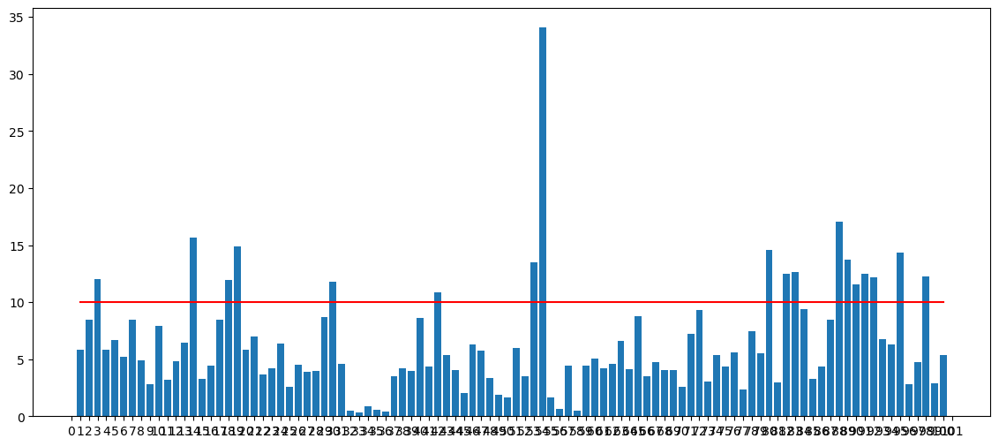

In [21]:
plt.figure(figsize=(14,6))
x_labels = np.arange(0,102)
no_df = pd.DataFrame({'score':smape_list})

plt.bar(np.arange(len(no_df))+1,no_df['score'])
plt.xticks(np.arange(102),x_labels)
plt.plot([1,100], [10, 10], color = 'red')
plt.show()

In [22]:
xgb_params['alpha'] = alpha_list
xgb_params['best_it'] = best_it
xgb_params.head()

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,best_it
0,100,0.01,3,6,0.9,0.9,100,331
1,100,0.01,10,8,0.9,0.9,3,342
2,100,0.01,7,3,0.9,0.9,0,333
3,100,0.01,9,5,0.9,0.9,0,615
4,100,0.01,10,5,0.8,0.9,75,343


In [38]:
merged_test_df.head()


,building_number,temperature,rainfall,windspeed,humidity,hour,day,month,week,day_hour_mean,hour_mean,hour_std,CDH,holiday,sin_time,cos_time,THI,max_power,min_power
0,1,23.5,0.0,2.2,72,0,3,8,34,1627.80,1706.318118,446.882767,-2.5,0,0.000000,1.000000,58.3456,4250.12,1325.32
1,1,23.0,0.0,0.9,72,1,3,8,34,1550.08,1622.620235,439.662704,-5.5,0,0.258819,0.965926,57.4456,4250.12,1325.32
2,1,22.7,0.0,1.5,75,2,3,8,34,1431.12,1506.971294,412.071906,-8.8,0,0.500000,0.866025,57.8725,4250.12,1325.32
3,1,22.1,0.0,1.3,78,3,3,8,34,1372.20,1437.365647,391.205981,-12.7,0,0.707107,0.707107,57.9376,4250.12,1325.32
4,1,21.8,0.0,1.0,77,4,3,8,34,1381.72,1447.321412,381.099697,-16.9,0,0.866025,0.500000,56.9961,4250.12,1325.32


In [39]:
merged_train_df.head()

,building_number,temperature,rainfall,windspeed,humidity,power_consumption,hour,day,month,week,day_hour_mean,hour_mean,hour_std,CDH,holiday,sin_time,cos_time,THI,max_power,min_power
0,1,18.6,0.0,0.9,42.0,1085.28,0,2,6,22,1774.744615,1706.318118,446.882767,-7.4,1,0.000000,1.000000,49.6576,4210.375385,1291.901538
1,1,18.0,0.0,1.1,45.0,1047.36,1,2,6,22,1687.347692,1622.620235,439.662704,-15.4,1,0.258819,0.965926,47.7625,4210.375385,1291.901538
2,1,17.7,0.0,1.5,45.0,974.88,2,2,6,22,1571.483077,1506.971294,412.071906,-23.7,1,0.500000,0.866025,47.2225,4210.375385,1291.901538
3,1,16.7,0.0,1.4,48.0,953.76,3,2,6,22,1522.153846,1437.365647,391.205981,-33.0,1,0.707107,0.707107,44.7856,4210.375385,1291.901538
4,1,18.4,0.0,2.8,43.0,986.40,4,2,6,22,1506.793846,1447.321412,381.099697,-40.6,1,0.866025,0.500000,49.0061,4210.375385,1291.901538


In [23]:
xgb_params.to_csv('./parameters/hyperparameter_xgb_split2_lbw.csv', index=False)

In [24]:
xgb_params = pd.read_csv('./parameters/hyperparameter_xgb_split2_lbw.csv')
#best_it = xgb_params['best_it'].to_list()
#best_it[0]        # 1051
xgb_params.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   n_estimators      100 non-null    int64  
 1   eta               100 non-null    float64
 2   min_child_weight  100 non-null    int64  
 3   max_depth         100 non-null    int64  
 4   colsample_bytree  100 non-null    float64
 5   subsample         100 non-null    float64
 6   alpha             100 non-null    int64  
 7   best_it           100 non-null    int64  
dtypes: float64(3), int64(5)
memory usage: 6.4 KB


## 학습

In [25]:
preds = np.array([])
scores=[]
missfit_building=[]
for i in tqdm(np.arange(1,101,1)):

    pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame

    for seed in [0,1,2,3,4,5]: # 각 시드별 예측
        y_train = merged_semi_train_df.loc[merged_semi_train_df.building_number == i, 'power_consumption']
        x_train = merged_semi_train_df.loc[merged_semi_train_df.building_number == i].drop(['power_consumption'], axis=1)

        y_pretest = merged_pretest_df.loc[merged_pretest_df.building_number == i, 'power_consumption']
        x_pretest = merged_pretest_df.loc[merged_pretest_df.building_number == i].drop(['power_consumption'], axis=1)

        xgb = XGBRegressor(seed = seed, n_estimators = xgb_params.iloc[i-1, 7], eta = 0.01,
                           min_child_weight = xgb_params.iloc[i-1, 2], max_depth = xgb_params.iloc[i-1, 3],
                           colsample_bytree=xgb_params.iloc[i-1, 4], subsample=xgb_params.iloc[i-1, 5])

        if xgb_params.iloc[i-1,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
            xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i-1,6])})

        xgb.fit(x_train, y_train)
        y_pred = xgb.predict(x_pretest)
        pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기

    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
    pred_np = pred.to_numpy()
    y_pretest_np = y_pretest.to_numpy()
    score = SMAPE(y_pretest_np, pred_np)
    
    scores.append(score)
    preds = np.append(preds, pred)

    if score > 6:
        missfit_building.append(i)

100%|██████████| 100/100 [06:07<00:00,  3.68s/it]


In [26]:
np.mean(scores)
miss_score=[]
for i in missfit_building:
    miss_score.append(scores[i-1])

miss_data = pd.DataFrame({'building_number': missfit_building, 'SMAPE': miss_score})


In [27]:
miss_data.to_csv('./miss_data_split2_lbw.csv', index=False)

In [28]:
all_scores = pd.DataFrame({'building_score': scores})
all_scores.to_csv('./all_scores_split2_lbw.csv', index=False)

In [29]:
preds = np.array([])
for i in tqdm(np.arange(1,101,1)):

    pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame

    for seed in [0,1,2,3,4,5]: # 각 시드별 예측
        y_train = final_train_df.loc[final_train_df.building_number == i, 'power_consumption']
        x_train = final_train_df.loc[final_train_df.building_number == i].drop(['power_consumption'], axis=1)
        x_test = merged_test_df.loc[merged_test_df.building_number == i]
        
        x_test = x_test[x_train.columns]

        xgb = XGBRegressor(seed = seed, n_estimators = xgb_params.iloc[i-1, 7], eta = 0.01,
                           min_child_weight = xgb_params.iloc[i-1, 2], max_depth = xgb_params.iloc[i-1, 3],
                           colsample_bytree=xgb_params.iloc[i-1, 4], subsample=xgb_params.iloc[i-1, 5])

        if xgb_params.iloc[i-1,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
            xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i-1,6])})

        xgb.fit(x_train, y_train)
        y_pred = xgb.predict(x_test)
        pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기

    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
    preds = np.append(preds, pred)
    

100%|██████████| 100/100 [06:26<00:00,  3.86s/it]


## 테스트

In [30]:
preds = pd.Series(preds)

fig, ax = plt.subplots(100, 1, figsize=(100,200), sharex = True)
ax = ax.flatten()
for i in range(100):
    train_y = final_train_df.loc[final_train_df.building_number == i+1, 'power_consumption'].reset_index(drop = True)
    test_y = preds[i*168:(i+1)*168]
    ax[i].scatter(np.arange(2040), train_y)
    ax[i].scatter(np.arange(2040, 2040+168) , test_y)
    ax[i].tick_params(axis='both', which='major', labelsize=6)
    ax[i].tick_params(axis='both', which='minor', labelsize=4)
plt.savefig('./predict_xgb_split2_lbw.png')


## 제출

In [32]:
splitx = pd.read_csv('./parameters/hyperparameter_xgb_holly2_lbw.csv')
splito = pd.read_csv('./parameters/hyperparameter_xgb_split_lbw.csv')

In [38]:
all_score2 = pd.read_csv('./all_scores2_lbw.csv')
all_score1 = pd.read_csv('./all_scores_split_lbw.csv')
all_score3 = all_score1-all_score2
print(np.mean(all_score3))

building_score    0.450917
dtype: float64


In [31]:
submission = pd.read_csv('./data/sample_submission.csv')
submission['answer'] = preds
submission.to_csv('./submission/submission_xgb_split2_lbw.csv', index = False)


## 1등코드 원본


In [ ]:
# from sklearn.model_selection import PredefinedSplit, GridSearchCV
# from sklearn.metrics import make_scorer
# df = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample'])
# preds = np.array([])

# grid = {'n_estimators' : [100], 'eta' : [0.01], 'min_child_weight' : np.arange(1, 8, 1),
#         'max_depth' : np.arange(3,9,1) , 'colsample_bytree' :np.arange(0.8, 1.0, 0.1),
#         'subsample' :np.arange(0.8, 1.0, 0.1)} # fix the n_estimators & eta(learning rate)

# for i in tqdm(np.arange(1, 101, 1)):
#     y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
#     x = merged_train_df.loc[merged_train_df.building_number == i, ].drop('power_consumption', axis=1)
#     y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

#     smape_score = make_scorer(SMAPE, graeter_is_better=False)
#     pds = PredefinedSplit(np.append(-np.ones(len(x)-168), np.zeros(168)))
#     gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1,
#                                                  tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
#                          param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)
#     # gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1,
#     #                                             tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
#     #                    param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)


#     gcv.fit(x_train, y_train)
#     best = gcv.best_estimator_
#     params = gcv.best_params_
#     print(params)
#     pred = best.predict(x_test)
#     building = 'building'+str(i)
#     print(building + '|| SMAPE : {}'.format(SMAPE(y_test, pred)))
#     preds = np.append(preds, pred)
#     df = pd.concat([df, pd.DataFrame(params, index = [0])], axis = 0)
#     df.to_csv('./hyperparameter_xgb.csv', index = False) # save the tuned parameters

## 